This document will demonstrate the code execution process block by block.

In [ ]:
import numpy as np
from sklearn.preprocessing import LabelEncoder
import pickle
import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.nn.functional as F
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report

In [ ]:
# Load the train file. Please enter the save location of the train document.
# The pkl file for training can be found on our publicly available Baidu Cloud Drive URL.
file_path = '/root/autodl-tmp/train_MOSEI_short_sbert_Hubert_long_features_with_labels.pkl'

# Use pickle to load the file.
with open(file_path, 'rb') as file:
    features1 = pickle.load(file)

# Print only the entries where the label is positive and negative.
for i, item in enumerate(features1):
    video_id = item.get('video_id', 'N/A')
    clip_id = item.get('clip_id', 'N/A')
    label_1 = item.get('label_1', 'N/A')
    label = item.get('label', 'N/A')
    mode = item.get('mode', 'N/A')
    text = item.get('text', 'N/A')
    text_feature_shape = item['text_feature'].shape if 'text_feature' in item else 'N/A'
    audio_feature_shape = item['audio_feature'].shape if 'audio_feature' in item else 'N/A'
    #vision_feature_shape = item['vision_features'].shape if 'vision_features' in item else 'N/A'
    vision_feature_shape = item['vision_feature_resnet'].shape  if 'vision_feature_resnet' in item else 'N/A'
    
    if label in ['Positive', 'Negative']:
        print(f"Item {i}:")
        print(f"  video_id: {video_id}")
        print(f"  clip_id: {clip_id}")
        print(f"  label_1: {label_1}")
        print(f"  label: {label}")
        print(f"  mode: {mode}")
        print(f"  text: {text}")
        print(f"  text_feature_shape: {text_feature_shape}")
        print(f"  audio_feature_shape: {audio_feature_shape}")
        print(f"  vision_feature_shape: {vision_feature_shape}")

Item 0:
  video_id: -3g5yACwYnA
  clip_id: 10
  label_1: 1.0
  label: Positive
  mode: train
  text: Key is part of the people that we use to solve those issues, whether it's stretch or outdoor resistance or abrasions or different technical aspects that we really need to solve to get into new markets, they've been able to bring solutions.
  text_feature_shape: (1, 50, 768)
  audio_feature_shape: torch.Size([1, 1284, 1024])
  vision_feature_shape: (25, 2048)
Item 1:
  video_id: -3g5yACwYnA
  clip_id: 13
  label_1: 0.6666666865348816
  label: Positive
  mode: train
  text: They've been able to find solutions or at least bring some answers to the table.
  text_feature_shape: (1, 19, 768)
  audio_feature_shape: torch.Size([1, 438, 1024])
  vision_feature_shape: (8, 2048)
Item 4:
  video_id: -3g5yACwYnA
  clip_id: 4
  label_1: 1.0
  label: Positive
  mode: train
  text: Key brings those types of aspects to a business on new markets, new potentials, and even on our equipment of how things ru

In [ ]:
#Load the pkl file for validation.
file_path = '/root/autodl-tmp/updated_valid_MOSEI_short_sbert_Hubert_long_features_with_labels.pkl'

# # Use pickle to load the file.
with open(file_path, 'rb') as file:
    features2 = pickle.load(file)

#  Print only the entries where the label is positive and negative.
for i, item in enumerate(features2):
    video_id = item.get('video_id', 'N/A')
    clip_id = item.get('clip_id', 'N/A')
    label_1 = item.get('label_1', 'N/A')
    label = item.get('label', 'N/A')
    mode = item.get('mode', 'N/A')
    text = item.get('text', 'N/A')
    text_feature_shape = item['text_feature'].shape if 'text_feature' in item else 'N/A'
    audio_feature_shape = item['audio_feature'].shape if 'audio_feature' in item else 'N/A'
    #vision_feature_shape = item['vision_features'].shape if 'vision_features' in item else 'N/A'
    vision_feature_shape = item['vision_feature_resnet'].shape  if 'vision_feature_resnet' in item else 'N/A'
    
    if label in ['Positive', 'Negative']:
        print(f"Item {i}:")
        print(f"  video_id: {video_id}")
        print(f"  clip_id: {clip_id}")
        print(f"  label_1: {label_1}")
        print(f"  label: {label}")
        print(f"  mode: {mode}")
        print(f"  text: {text}")
        print(f"  text_feature_shape: {text_feature_shape}")
        print(f"  audio_feature_shape: {audio_feature_shape}")
        print(f"  vision_feature_shape: {vision_feature_shape}")
        #print(f"  vision_feature_shape: {vision_feature}")

Item 0:
  video_id: --qXJuDtHPw
  clip_id: 5
  label_1: 1.0
  label: Positive
  mode: valid
  text: I see that a writer is somebody who has an incredible command of mechanics of the English language.
  text_feature_shape: (1, 21, 768)
  audio_feature_shape: torch.Size([1, 691, 1024])
  vision_feature_shape: (13, 2048)
Item 2:
  video_id: -571d8cVauQ
  clip_id: 3
  label_1: -0.6666666865348816
  label: Negative
  mode: valid
  text: However, again on a low budget film there's not often money to pay a crew of people to go out and do this.
  text_feature_shape: (1, 28, 768)
  audio_feature_shape: torch.Size([1, 588, 1024])
  vision_feature_shape: (11, 2048)
Item 3:
  video_id: -571d8cVauQ
  clip_id: 5
  label_1: 0.3333333432674408
  label: Positive
  mode: valid
  text: So very important to go out to the locations, walk around, talk with the owners if you can, tell them what you're doing, build a little excitement, put a little glitz on there and let everybody knows this is a very valuabl

In [ ]:
# Load the test file. Please enter the save location of the train document.
file_path = '/root/autodl-tmp/test_MOSEI_short_sbert_Hubert_long_features_with_labels.pkl'

with open(file_path, 'rb') as file:
    features3 = pickle.load(file)

for i, item in enumerate(features3):
    video_id = item.get('video_id', 'N/A')
    clip_id = item.get('clip_id', 'N/A')
    label_1 = item.get('label_1', 'N/A')
    label = item.get('label', 'N/A')
    mode = item.get('mode', 'N/A')
    text = item.get('text', 'N/A')
    text_feature_shape = item['text_feature'].shape if 'text_feature' in item else 'N/A'
    audio_feature_shape = item['audio_feature'].shape if 'audio_feature' in item else 'N/A'
    vision_feature_shape = item['vision_feature_resnet'].shape if 'vision_feature_resnet' in item else 'N/A'
    
    if label in ['Positive', 'Negative']:
        print(f"Item {i}:")
        print(f"  video_id: {video_id}")
        print(f"  clip_id: {clip_id}")
        print(f"  label_1: {label_1}")
        print(f"  label: {label}")
        print(f"  mode: {mode}")
        print(f"  text: {text}")
        print(f"  text_feature_shape: {text_feature_shape}")
        print(f"  audio_feature_shape: {audio_feature_shape}")
        print(f"  vision_feature_shape: {vision_feature_shape}")

Item 0:
  video_id: -6rXp3zJ3kc
  clip_id: 9
  label_1: 0.3333333432674408
  label: Positive
  mode: test
  text: So the answer to the question, can I contribute stock to an IRA is absolutely correct but always be mindful of the security that your using it, make sure it's safe.
  text_feature_shape: (1, 37, 768)
  audio_feature_shape: torch.Size([1, 1104, 1024])
  vision_feature_shape: (22, 2048)
Item 1:
  video_id: -6rXp3zJ3kc
  clip_id: 8
  label_1: -1.0
  label: Negative
  mode: test
  text: Many people are not until they get to be a older age and they realize that gosh they wasted a lot of time and money in placing bets on stock that's ultimately lost value.
  text_feature_shape: (1, 39, 768)
  audio_feature_shape: torch.Size([1, 828, 1024])
  vision_feature_shape: (16, 2048)
Item 3:
  video_id: -9y-fZ3swSY
  clip_id: 1
  label_1: 1.3333333730697632
  label: Positive
  mode: test
  text: It’s so nice, by giving a good example and not directly comparing it to a lady
  text_feature_s

In [ ]:
train_data = [item for item in features1 if item['mode'] == 'train' and item['label'] in ['Positive', 'Negative']]
valid_data = [item for item in features2 if item['mode'] == 'valid' and item['label'] in ['Positive', 'Negative']]
test_data = [item for item in features3 if item['mode'] == 'test' and item['label'] in ['Positive', 'Negative']]

In [5]:
del features3, features1, features2

In [6]:
print(len(train_data))
print(len(valid_data))
print(len(test_data))

12779
1438
3634


In [ ]:
# Find the labels and corresponding features.
train_y = np.array([item['label'] for item in train_data])
valid_y = np.array([item['label'] for item in valid_data])
test_y = np.array([item['label'] for item in test_data])

train_X_text = [item['text_feature'] for item in train_data]
valid_X_text = [item['text_feature'] for item in valid_data]
test_X_text = [item['text_feature'] for item in test_data]

train_X_audio = [item['audio_feature'] for item in train_data]
valid_X_audio = [item['audio_feature'] for item in valid_data]
test_X_audio = [item['audio_feature'] for item in test_data]

train_X_vision = [item['vision_feature_resnet'] for item in train_data]
valid_X_vision = [item['vision_feature_resnet'] for item in valid_data]
test_X_vision = [item['vision_feature_resnet'] for item in test_data]

print("Sample converted labels (train):", train_y[:10])
print("Sample converted labels (valid):", valid_y[:10])
print("Sample converted labels (test):", test_y[:10])


Sample converted labels (train): ['Positive' 'Positive' 'Positive' 'Positive' 'Positive' 'Positive'
 'Negative' 'Positive' 'Negative' 'Negative']
Sample converted labels (valid): ['Positive' 'Negative' 'Positive' 'Negative' 'Positive' 'Negative'
 'Negative' 'Negative' 'Positive' 'Positive']
Sample converted labels (test): ['Positive' 'Negative' 'Positive' 'Positive' 'Positive' 'Positive'
 'Positive' 'Negative' 'Positive' 'Positive']


In [8]:
del train_data, valid_data, test_data

In [ ]:
# Initialize the label encoder
label_encoder = LabelEncoder()

# Fit and transform the training labels
train_Y = label_encoder.fit_transform(train_y)

# Use the same encoder to transform the validation labels
valid_Y = label_encoder.transform(valid_y)

# Transform the test labels using the same encoder
test_Y = label_encoder.transform(test_y)


In [ ]:
# Put all feature data into a dictionary
text_features = {
    'train_audio': train_X_audio,
    'valid_audio': valid_X_audio,
    'test_audio': test_X_audio
}

# Iterate through the dictionary, convert to tensor, remove dimensions, and print the shape
for key, features in text_features.items():
    for i, feature in enumerate(features):   # Iterate through each feature
        tensor_feature = torch.tensor(feature)   # Convert the feature to a tensor
        tensor_feature = tensor_feature.squeeze(0)  # Remove the dimension of size 1 (assumed to be the first dimension)
        text_features[key][i] = tensor_feature  # Update the feature in the dictionary
        print(f"Feature in {key} at index {i} has shape: {tensor_feature.shape}")

/tmp/ipykernel_3891/2523887850.py:13: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  tensor_feature = torch.tensor(feature)  # 将特征转换为tensor


Feature in train_audio at index 0 has shape: torch.Size([1284, 1024])
Feature in train_audio at index 1 has shape: torch.Size([438, 1024])
Feature in train_audio at index 2 has shape: torch.Size([821, 1024])
Feature in train_audio at index 3 has shape: torch.Size([811, 1024])
Feature in train_audio at index 4 has shape: torch.Size([464, 1024])
Feature in train_audio at index 5 has shape: torch.Size([591, 1024])
Feature in train_audio at index 6 has shape: torch.Size([573, 1024])
Feature in train_audio at index 7 has shape: torch.Size([366, 1024])
Feature in train_audio at index 8 has shape: torch.Size([573, 1024])
Feature in train_audio at index 9 has shape: torch.Size([668, 1024])
Feature in train_audio at index 10 has shape: torch.Size([433, 1024])
Feature in train_audio at index 11 has shape: torch.Size([571, 1024])
Feature in train_audio at index 12 has shape: torch.Size([458, 1024])
Feature in train_audio at index 13 has shape: torch.Size([455, 1024])
Feature in train_audio at ind

In [ ]:
text_features = {
    'train_text': train_X_text,
    'valid_text': valid_X_text,
    'test_text': test_X_text
}

# 遍历字典，转换为tensor并去掉维度，然后打印形状
for key, features in text_features.items():
    for i, feature in enumerate(features):
        tensor_feature = torch.tensor(feature)  
        tensor_feature = tensor_feature.squeeze(0)   
        text_features[key][i] = tensor_feature  
        print(f"Feature in {key} at index {i} has shape: {tensor_feature.shape}")

Feature in train_text at index 0 has shape: torch.Size([50, 768])
Feature in train_text at index 1 has shape: torch.Size([19, 768])
Feature in train_text at index 2 has shape: torch.Size([41, 768])
Feature in train_text at index 3 has shape: torch.Size([30, 768])
Feature in train_text at index 4 has shape: torch.Size([43, 768])
Feature in train_text at index 5 has shape: torch.Size([22, 768])
Feature in train_text at index 6 has shape: torch.Size([32, 768])
Feature in train_text at index 7 has shape: torch.Size([20, 768])
Feature in train_text at index 8 has shape: torch.Size([12, 768])
Feature in train_text at index 9 has shape: torch.Size([22, 768])
Feature in train_text at index 10 has shape: torch.Size([19, 768])
Feature in train_text at index 11 has shape: torch.Size([25, 768])
Feature in train_text at index 12 has shape: torch.Size([21, 768])
Feature in train_text at index 13 has shape: torch.Size([19, 768])
Feature in train_text at index 14 has shape: torch.Size([35, 768])
Featu

In [ ]:
vision_features = {
    'train_vision': train_X_vision,
    'valid_vision': valid_X_vision,
    'test_vision': test_X_vision
}

for key, features in vision_features.items():
    for i, feature in enumerate(features):
        tensor_feature = torch.tensor(feature)   
        vision_features[key][i] = tensor_feature   
        print(f"Feature in {key} at index {i} has shape: {tensor_feature.shape}")

Feature in train_vision at index 0 has shape: torch.Size([25, 2048])
Feature in train_vision at index 1 has shape: torch.Size([8, 2048])
Feature in train_vision at index 2 has shape: torch.Size([16, 2048])
Feature in train_vision at index 3 has shape: torch.Size([16, 2048])
Feature in train_vision at index 4 has shape: torch.Size([9, 2048])
Feature in train_vision at index 5 has shape: torch.Size([11, 2048])
Feature in train_vision at index 6 has shape: torch.Size([11, 2048])
Feature in train_vision at index 7 has shape: torch.Size([7, 2048])
Feature in train_vision at index 8 has shape: torch.Size([11, 2048])
Feature in train_vision at index 9 has shape: torch.Size([13, 2048])
Feature in train_vision at index 10 has shape: torch.Size([8, 2048])
Feature in train_vision at index 11 has shape: torch.Size([11, 2048])
Feature in train_vision at index 12 has shape: torch.Size([9, 2048])
Feature in train_vision at index 13 has shape: torch.Size([9, 2048])
Feature in train_vision at index 14 

In [ ]:
# Convert labels to tensor
train_Y_tensor = torch.tensor(train_Y)
valid_Y_tensor = torch.tensor(valid_Y)
test_Y_tensor = torch.tensor(test_Y)

In [ ]:
# Define dataset
class ThreeModal_Dataset(Dataset):
    def __init__(self, text_features, audio_features,vision_features, labels):
        self.text_features = text_features
        self.audio_features = audio_features
        self.vision_features = vision_features
        self.labels = labels

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        text_features = self.text_features[idx]
        audio_features = self.audio_features[idx]
        vision_features = self.vision_features[idx]
        labels = self.labels[idx]
        return text_features, audio_features, vision_features, labels

In [ ]:
def collate_fn(batch):
    # Separate audio features, text features, and labels from the batch
    text_features, audio_features, vision_features, labels = zip(*batch)
    
    # Pad text features and audio features to the longest sequence in the batch
    text_features_padded = pad_sequence(text_features, batch_first=True)    
    audio_features_padded = pad_sequence(audio_features, batch_first=True)
    vision_features_padded = pad_sequence(vision_features, batch_first=True)    
    
    # Convert labels to tensor
    labels = torch.tensor(labels)

    return text_features_padded, audio_features_padded, vision_features_padded, labels


In [ ]:
# Create Dataset instances
train_dataset = ThreeModal_Dataset(train_X_text, train_X_audio, train_X_vision, train_Y_tensor)
valid_dataset = ThreeModal_Dataset(valid_X_text, valid_X_audio, valid_X_vision, valid_Y_tensor)
test_dataset = ThreeModal_Dataset(test_X_text, test_X_audio, test_X_vision, test_Y_tensor)

# Create DataLoader using the custom collate_fn
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=2, collate_fn=collate_fn)
valid_loader = DataLoader(valid_dataset, batch_size=8, shuffle=False, num_workers=2, collate_fn=collate_fn)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False, num_workers=2, collate_fn=collate_fn)

In [19]:
del train_X_text, train_X_audio, train_X_vision, valid_X_text, valid_X_audio, valid_X_vision, valid_Y_tensor

NameError: name 'train_X_text' is not defined

In [ ]:
class SimpleCrossAttentionClassifier(nn.Module):
    def __init__(self, text_dim, audio_dim, vision_dim, hidden_dim, num_heads, dropout_rate=0.1):
        super(SimpleCrossAttentionClassifier, self).__init__()

        self.num_heads = num_heads
        self.hidden_dim = hidden_dim
        self.dropout = nn.Dropout(dropout_rate)

        # 文本和音频/视觉的线性投影，用于映射到统一的隐层维度
        self.text_to_hidden = nn.Linear(text_dim, hidden_dim)
        self.audio_to_hidden = nn.Linear(audio_dim, hidden_dim)
        self.vision_to_hidden = nn.Linear(vision_dim, hidden_dim)

        # Text-Audio 和 Vision-Text 的 Cross-Attention
        self.cross_attention_text_audio = nn.MultiheadAttention(embed_dim=hidden_dim, num_heads=num_heads, dropout=dropout_rate)
        self.cross_attention_vision_text = nn.MultiheadAttention(embed_dim=hidden_dim, num_heads=num_heads, dropout=dropout_rate)

        # 分类器
        self.classifier = nn.Linear(hidden_dim * 2, 1)  # 两个 Cross-Attention 输出拼接

    def forward(self, text_features, audio_features, vision_features):
        # 投影到隐层维度
        text_hidden = self.text_to_hidden(text_features)  # (batch_size, seq_len, hidden_dim)
        audio_hidden = self.audio_to_hidden(audio_features)  # (batch_size, seq_len, hidden_dim)
        vision_hidden = self.vision_to_hidden(vision_features)  # (batch_size, seq_len, hidden_dim)

        # 调整形状为 (seq_len, batch_size, hidden_dim) 以适应 MultiheadAttention
        text_hidden = text_hidden.permute(1, 0, 2)
        audio_hidden = audio_hidden.permute(1, 0, 2)
        vision_hidden = vision_hidden.permute(1, 0, 2)

        # Text-Audio Cross-Attention
        text_audio_output, _ = self.cross_attention_text_audio(query=text_hidden, key=audio_hidden, value=audio_hidden)
        text_audio_output = self.dropout(text_audio_output)  # 添加 Dropout
        text_audio_output = text_audio_output.permute(1, 0, 2)  # 调整回 (batch_size, seq_len, hidden_dim)

        # Vision-Text Cross-Attention
        vision_text_output, _ = self.cross_attention_vision_text(query=vision_hidden, key=text_hidden, value=text_hidden)
        vision_text_output = self.dropout(vision_text_output)  # 添加 Dropout
        vision_text_output = vision_text_output.permute(1, 0, 2)  # 调整回 (batch_size, seq_len, hidden_dim)

        # 对比学习 - 使用 InfoNCE 损失
        batch_size = text_audio_output.size(0)

        # 对输出进行 L2 归一化以便计算余弦相似度
        text_audio_norm = F.normalize(text_audio_output.mean(dim=1), p=2, dim=-1)
        vision_text_norm = F.normalize(vision_text_output.mean(dim=1), p=2, dim=-1)

        # 计算相似度矩阵
        similarity_matrix = torch.matmul(text_audio_norm, vision_text_norm.T)

        # 计算正样本的相似度（对角线）
        positive_samples = torch.diag(similarity_matrix)

        # 计算 InfoNCE 损失
        temperature = 0.07  # 温度参数，可调整
        similarity_matrix /= temperature
        positive_samples /= temperature

        # InfoNCE 损失计算
        contrastive_loss = -torch.log(
            torch.exp(positive_samples) / torch.exp(similarity_matrix).sum(dim=1)
        ).mean()

        # 池化操作：对序列维度取平均值
        text_audio_pooled = text_audio_output.mean(dim=1)  # (batch_size, hidden_dim)
        vision_text_pooled = vision_text_output.mean(dim=1)  # (batch_size, hidden_dim)

        # 拼接 Text-Audio 和 Vision-Text 的 Cross-Attention 输出
        combined_output = torch.cat((text_audio_pooled, vision_text_pooled), dim=1)  # (batch_size, hidden_dim * 2)

        # 分类
        output = self.classifier(combined_output)
        output = torch.sigmoid(output)  # 二分类问题

        return output, contrastive_loss


New best model saved with accuracy: 0.7698
Epoch 1: Train Loss = 0.0666, Train Accuracy = 0.6999, Valid Loss = 0.0648, Valid Accuracy = 0.7698
New best model saved with accuracy: 0.8157
Epoch 2: Train Loss = 0.0654, Train Accuracy = 0.7850, Valid Loss = 0.0646, Valid Accuracy = 0.8157
New best model saved with accuracy: 0.8289
Epoch 3: Train Loss = 0.0651, Train Accuracy = 0.8165, Valid Loss = 0.0651, Valid Accuracy = 0.8289
New best model saved with accuracy: 0.8408
Epoch 4: Train Loss = 0.0651, Train Accuracy = 0.8230, Valid Loss = 0.0644, Valid Accuracy = 0.8408
New best model saved with accuracy: 0.8428
Epoch 5: Train Loss = 0.0649, Train Accuracy = 0.8368, Valid Loss = 0.0642, Valid Accuracy = 0.8428
New best model saved with accuracy: 0.8554
Epoch 6: Train Loss = 0.0647, Train Accuracy = 0.8451, Valid Loss = 0.0647, Valid Accuracy = 0.8554
New best model saved with accuracy: 0.8595
Epoch 7: Train Loss = 0.0646, Train Accuracy = 0.8451, Valid Loss = 0.0646, Valid Accuracy = 0.8595

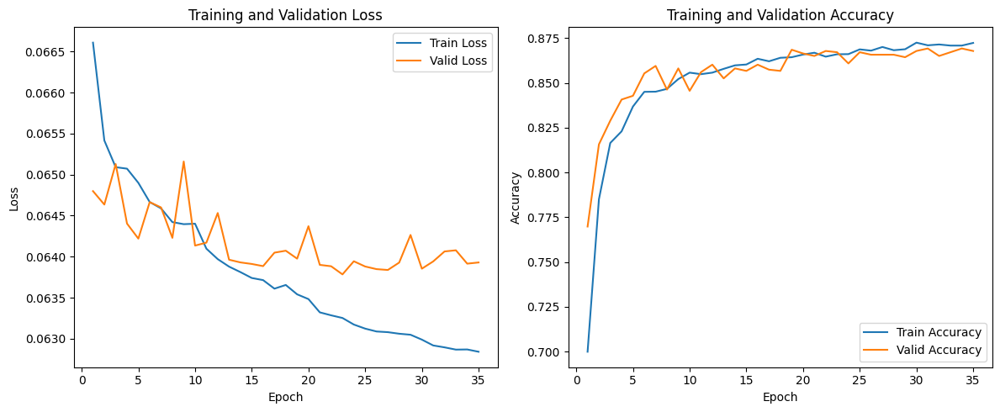

In [ ]:
import torch
import torch.optim as optim
import torch.nn as nn
import matplotlib.pyplot as plt

# Check if a GPU is available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Initialize the SimpleCrossAttentionClassifier model and move it to the GPU
model = SimpleCrossAttentionClassifier(
    text_dim=768,
    audio_dim=1024,
    vision_dim=2048,
    hidden_dim=256,
    num_heads=8,
    dropout_rate=0.01
).to(device)

# Define the loss function and optimizer
classification_criterion = nn.BCEWithLogitsLoss()
contrastive_weight = 0.0001  # Control the weight of the contrastive loss, can be adjusted
optimizer = optim.AdamW(model.parameters(), lr=0.00005, weight_decay=0.01)

# Set up the learning rate scheduler
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)

# Set the number of epochs
num_epochs = 35
train_losses = []
valid_losses = []
train_accuracies = []
valid_accuracies = []

best_valid_accuracy = 0.0
best_model_path = 'best_model.pth'

# Training and validation loop
for epoch in range(num_epochs):
    model.train()
    train_loss, train_correct, train_samples = 0, 0, 0

    for audio_features, text_features, vision_features, labels in train_loader:
        audio_features, text_features, vision_features, labels = (
            audio_features.to(device),
            text_features.to(device),
            vision_features.to(device),
            labels.to(device)
        )
        optimizer.zero_grad()

        # Forward pass
        outputs, contrastive_loss = model(audio_features, text_features, vision_features)

        # Compute the loss (classification loss + contrastive loss)
        classification_loss = classification_criterion(outputs.squeeze(), labels.float())
        total_loss = classification_loss + contrastive_weight * contrastive_loss

        total_loss.backward()
        optimizer.step()

        train_loss += total_loss.item()
        predicted = torch.sigmoid(outputs.squeeze()).round()
        train_correct += (predicted == labels).sum().item()
        train_samples += labels.size(0)

    train_losses.append(train_loss / train_samples)
    train_accuracies.append(train_correct / train_samples)

    scheduler.step()

    # Validation mode
    model.eval()
    valid_loss, valid_correct, valid_samples = 0, 0, 0
    with torch.no_grad():
        for audio_features, text_features, vision_features, labels in valid_loader:
            audio_features, text_features, vision_features, labels = (
                audio_features.to(device),
                text_features.to(device),
                vision_features.to(device),
                labels.to(device)
            )
            outputs, contrastive_loss = model(audio_features, text_features, vision_features)

            classification_loss = classification_criterion(outputs.squeeze(), labels.float())
            total_loss = classification_loss + contrastive_weight * contrastive_loss

            valid_loss += total_loss.item()
            predicted = torch.sigmoid(outputs.squeeze()).round()
            valid_correct += (predicted == labels).sum().item()
            valid_samples += labels.size(0)

    valid_losses.append(valid_loss / valid_samples)
    valid_accuracies.append(valid_correct / valid_samples)

    # Save the best model
    if valid_accuracies[-1] > best_valid_accuracy:
        best_valid_accuracy = valid_accuracies[-1]
        torch.save(model.state_dict(), best_model_path)
        print(f"New best model saved with accuracy: {best_valid_accuracy:.4f}")

    print(f"Epoch {epoch+1}: Train Loss = {train_losses[-1]:.4f}, Train Accuracy = {train_accuracies[-1]:.4f}, Valid Loss = {valid_losses[-1]:.4f}, Valid Accuracy = {valid_accuracies[-1]:.4f}")

# Plot the training and validation losses
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(range(1, num_epochs+1), train_losses, label='Train Loss')
plt.plot(range(1, num_epochs+1), valid_losses, label='Valid Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# Plot the training and validation accuracies
plt.subplot(1, 2, 2)
plt.plot(range(1, num_epochs+1), train_accuracies, label='Train Accuracy')
plt.plot(range(1, num_epochs+1), valid_accuracies, label='Valid Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
# Check if a GPU is available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the best model weights
best_model_path = 'best_model.pth'
model.load_state_dict(torch.load(best_model_path))
model.to(device)
model.eval()  # Set the model to evaluation mode

# Initialize lists to collect true labels and predicted labels
true_labels = []
predicted_labels = []

# Evaluate on the test data
with torch.no_grad():
    for audio_features, text_features, vision_features, labels in test_loader:  # Assuming you have vision_features
        # Move audio, text, vision features, and labels to the GPU
        audio_features = audio_features.to(device)
        text_features = text_features.to(device)
        vision_features = vision_features.to(device)  # Contains vision features
        labels = labels.to(device)

        # Forward pass
        outputs, _ = model(audio_features, text_features, vision_features)  # Ignore contrastive loss if the model has it

        # Get predicted results and convert them to a numpy array
        predicted = torch.sigmoid(outputs.squeeze()).round().cpu().numpy()  # Binary classification, prediction is 0 or 1
        predicted_labels.extend(predicted)
        
        # Convert true labels to numpy array
        true_labels.extend(labels.cpu().numpy())

# Convert lists to NumPy arrays
true_labels = np.array(true_labels)
predicted_labels = np.array(predicted_labels)

# Compute the metrics
accuracy = accuracy_score(true_labels, predicted_labels)
precision = precision_score(true_labels, predicted_labels, average='binary')
recall = recall_score(true_labels, predicted_labels, average='binary')
f1 = f1_score(true_labels, predicted_labels, average='binary')

# Compute the confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Avoid division by zero and compute UA (Unweighted Average) and WA (Weighted Average)
with np.errstate(divide='ignore', invalid='ignore'):
    per_class_accuracy = np.diag(cm) / np.sum(cm, axis=1)
    per_class_accuracy = np.nan_to_num(per_class_accuracy)  # Convert NaN to 0 to avoid errors in calculation
    ua = np.mean(per_class_accuracy)  # Unweighted Average (UA)

wa = accuracy  # Weighted Average (WA), for binary classification, weighted average equals overall accuracy

# Print the results
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Unweighted Average (UA): {ua:.4f}")
print(f"Weighted Average (WA): {wa:.4f}")

# Print detailed classification report
print("\nDetailed classification report:")
print(classification_report(true_labels, predicted_labels, target_names=['Class 0', 'Class 1']))


Accuracy: 0.8635
Precision: 0.8753
Recall: 0.9129
F1 Score: 0.8937
Unweighted Average (UA): 0.8464
Weighted Average (WA): 0.8635

Detailed classification report:
              precision    recall  f1-score   support

     Class 0       0.84      0.78      0.81      1350
     Class 1       0.88      0.91      0.89      2284

    accuracy                           0.86      3634
   macro avg       0.86      0.85      0.85      3634
weighted avg       0.86      0.86      0.86      3634

